# Perturbation Trasmission and Graph visualization


In [100]:
# Import necessary libraries
import networkx as nx  # For creating and manipulating graphs
import numpy as np  # For numerical operations
import matplotlib.pyplot as plt  # For plotting
from matplotlib.patches import Patch  # For creating custom legend patches

# Set the plotting style to 'ggplot'
plt.style.use('ggplot')

# Set the default figure size to [10, 5] inches
plt.rcParams['figure.figsize'] = [10, 10]

## SIRS model simulation

In [63]:
def dW(delta_t: float) -> float:
    """Sample a random number at each call.

    Parameters:
    - delta_t (float): Time step.

    Returns:
    - float: Random number sampled.
    """
    return np.random.normal(loc=0.0, scale=np.sqrt(delta_t))

# Example parameters dictionary
parameters = {
    't_in': 0,
    't_end': 5,
    'N': 5000,
    'mu': 0.009,
    'b0': 36.4,
    'b1': 0.38,
    'phi': 1.07,
    'gamma': 1.8,
    'ni': 36,
    'alpha': 0.25,
    'S_in': 0.998,
    'I_in': 0.002,
    'R_in': 0.0
}

def Euler_Maruyama_method(parameters):
    t_in = parameters['t_in']
    t_end = parameters['t_end']
    N = parameters['N']
    mu = parameters['mu']
    b0 = parameters['b0']
    b1 = parameters['b1']
    phi = parameters['phi']
    gamma = parameters['gamma']
    ni = parameters['ni']
    alpha = parameters['alpha']
    S_in = parameters['S_in']
    I_in = parameters['I_in']
    R_in = parameters['R_in']

    dt = float((t_end - t_in) / N)
    TS = np.arange(t_in, t_end + dt, dt)
    assert TS.size == N + 1

    Ss = np.zeros(TS.size)
    Is = np.zeros(TS.size)
    Rs = np.zeros(TS.size)

    Ss[0] = S_in
    Is[0] = I_in
    Rs[0] = R_in

    for i in range(1, TS.size):
        t = t_in + (i - 1) * dt
        S = Ss[i - 1]
        I = Is[i - 1]
        R = Rs[i - 1]

        b0_tilde = b0 + alpha * dW(dt)
        beta = b0_tilde * (1 + b1 * np.cos(2 * np.pi * t + phi))

        dW_dt = dW(dt)
        Ss[i] = S + ((mu - mu * S - beta * S * I + gamma * R) * dt - (alpha / b0_tilde) * beta * S * I * dW_dt)
        Is[i] = I + ((beta * S * I - ni * I - mu * I) * dt - (alpha / b0_tilde) * beta * S * I * dW_dt)
        Rs[i] = R + (ni * I - mu * R - gamma * R) * dt

    return TS, Ss, Is, Rs

TS, Ss, Is, Rs = Euler_Maruyama_method(parameters)

# Calculate basic reproduction number R0
def calculate_R0(beta, gamma):
    return beta / gamma

# Calculate R0
beta = parameters['b0']
gamma = parameters['ni']
R0 = calculate_R0(beta, gamma)

print(f"Basic Reproduction Number (R0): {R0}")

# Interpretation of R0
if R0 < 1:
    print("The infection will likely die out over time.")
elif R0 == 1:
    print("The infection will remain stable in the population but not cause an outbreak.")
else:
    print("The infection will likely spread and cause an epidemic.")

# Additional statistics
peak_infection = max(Is)
final_size = Ss[-1] + Is[-1] + Rs[-1]
print(f"Peak Infection: {peak_infection}")
print(f"Final Size of the Epidemic: {final_size}")

Basic Reproduction Number (R0): 1.011111111111111
The infection will likely spread and cause an epidemic.
Peak Infection: 0.0029166861401997857
Final Size of the Epidemic: 1.0003894450917858


### SIRS PLOTS

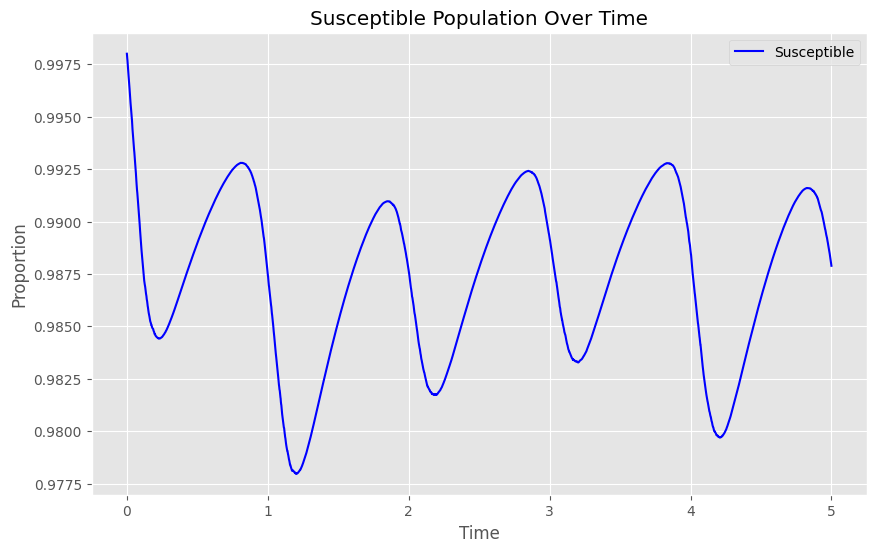

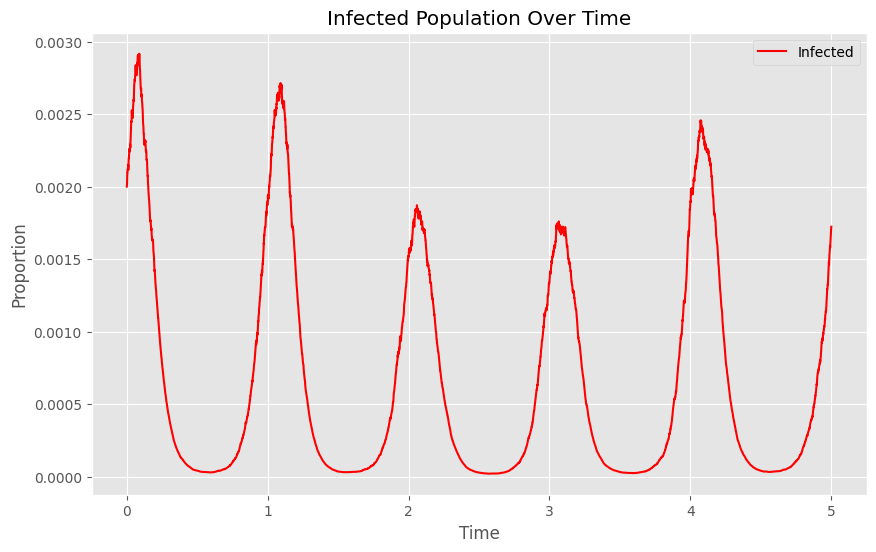

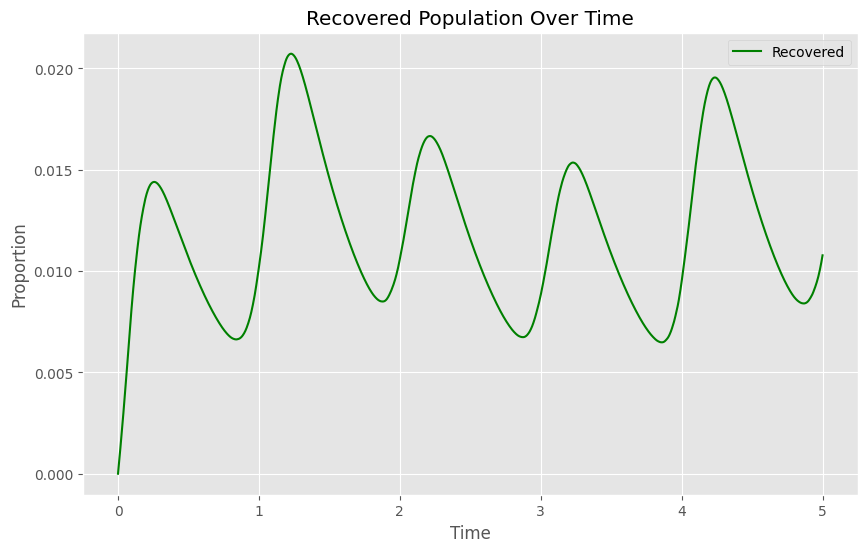

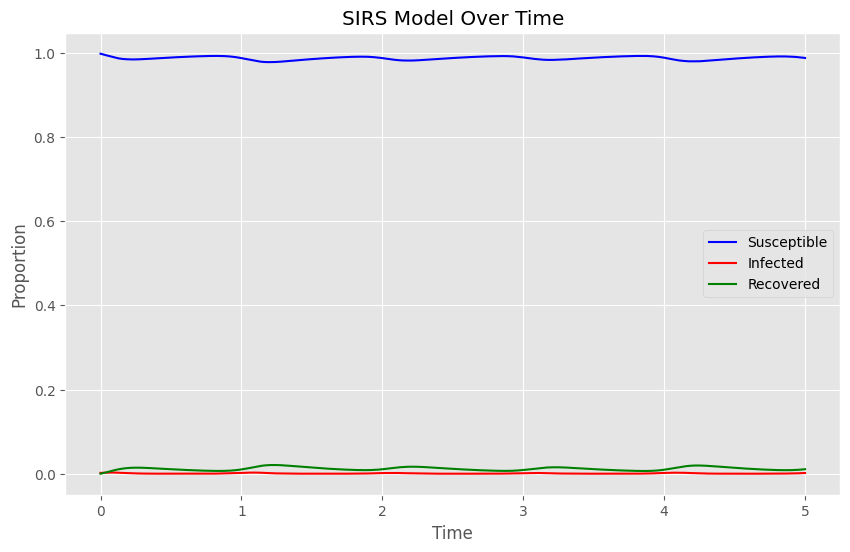

In [64]:
# Plot Susceptible over time
plt.figure(figsize=(10, 6))
plt.plot(TS, Ss, label='Susceptible', color='blue')
plt.xlabel('Time')
plt.ylabel('Proportion')
plt.title('Susceptible Population Over Time')
plt.legend()
plt.grid(True)
plt.show()

# Plot Infected over time
plt.figure(figsize=(10, 6))
plt.plot(TS, Is, label='Infected', color='red')
plt.xlabel('Time')
plt.ylabel('Proportion')
plt.title('Infected Population Over Time')
plt.legend()
plt.grid(True)
plt.show()

# Plot Recovered over time
plt.figure(figsize=(10, 6))
plt.plot(TS, Rs, label='Recovered', color='green')
plt.xlabel('Time')
plt.ylabel('Proportion')
plt.title('Recovered Population Over Time')
plt.legend()
plt.grid(True)
plt.show()

# Plot all three (S, I, R) on the same graph
plt.figure(figsize=(10, 6))
plt.plot(TS, Ss, label='Susceptible', color='blue')
plt.plot(TS, Is, label='Infected', color='red')
plt.plot(TS, Rs, label='Recovered', color='green')
plt.xlabel('Time')
plt.ylabel('Proportion')
plt.title('SIRS Model Over Time')
plt.legend()
plt.grid(True)
plt.show()


# NetworkX

## 1. Small-World Networks (Watts-Strogatz Model)

Small-world networks have high clustering like regular networks but also have short average path lengths between nodes. The Watts-Strogatz model can be used to generate small-world networks.

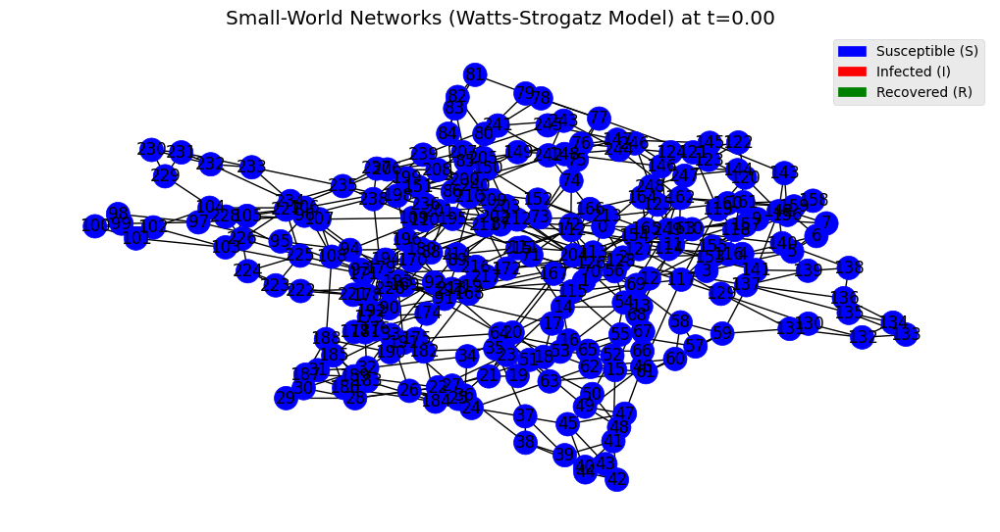

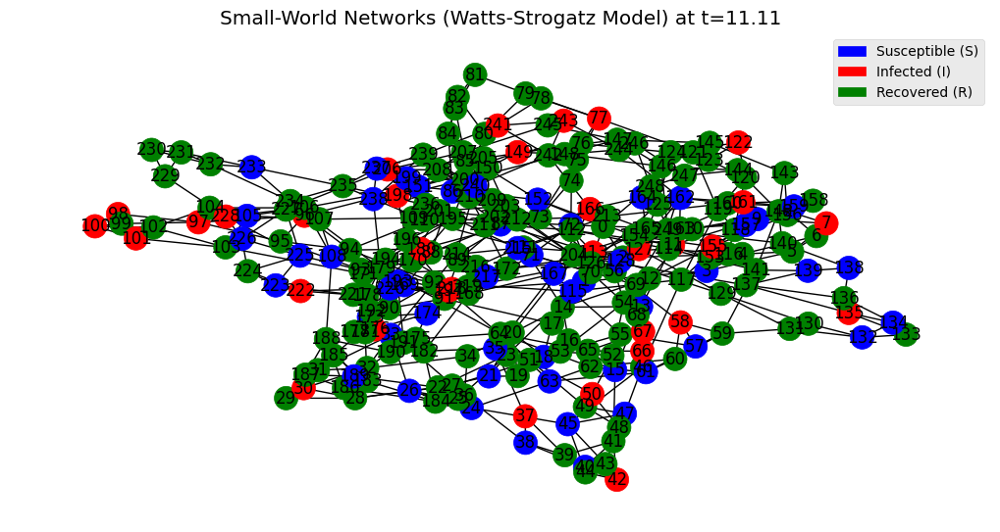

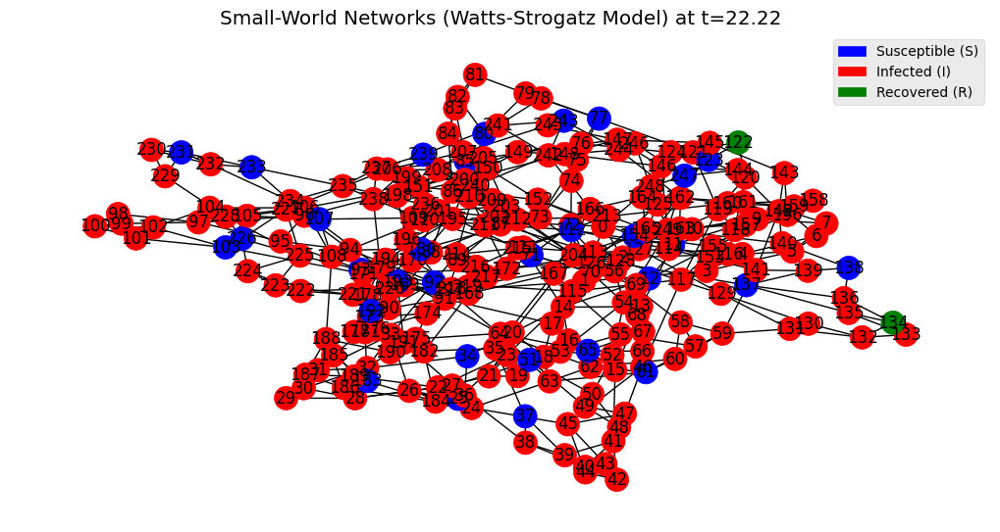

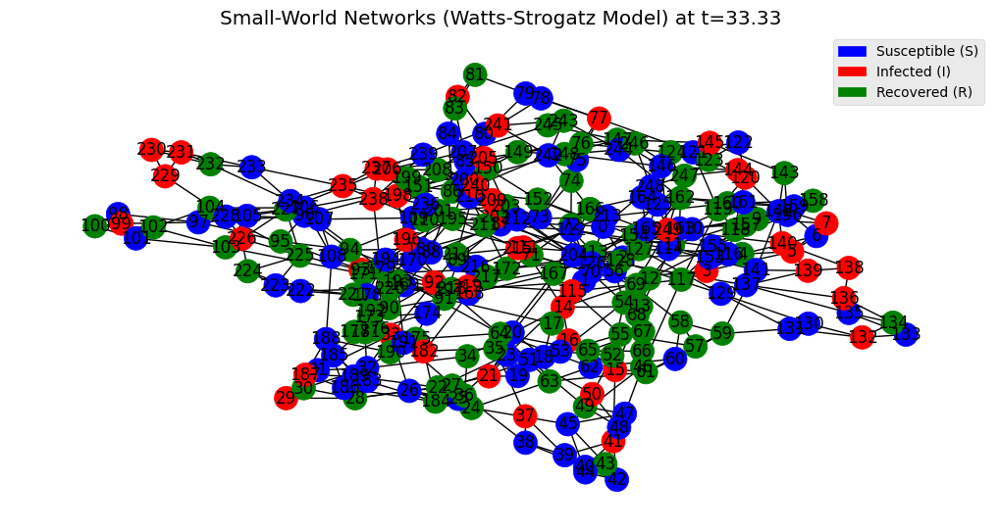

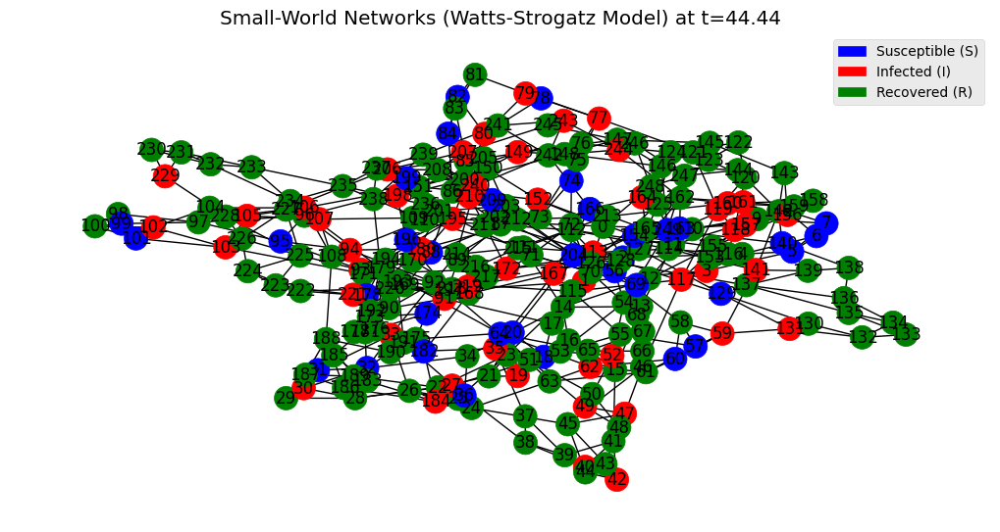

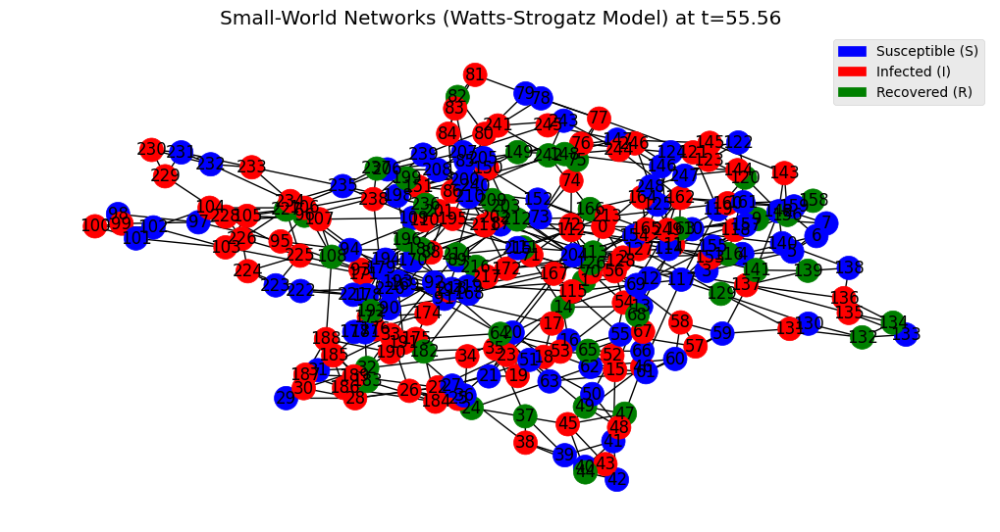

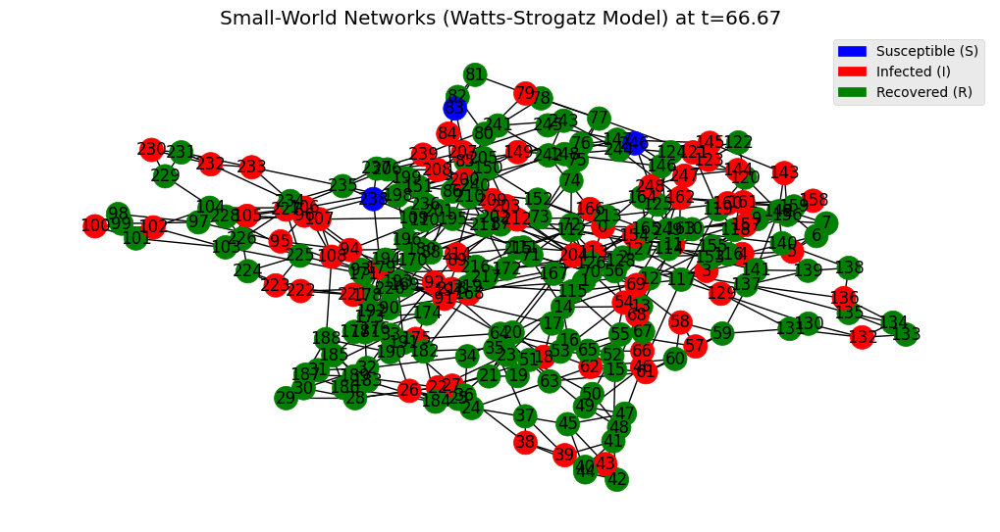

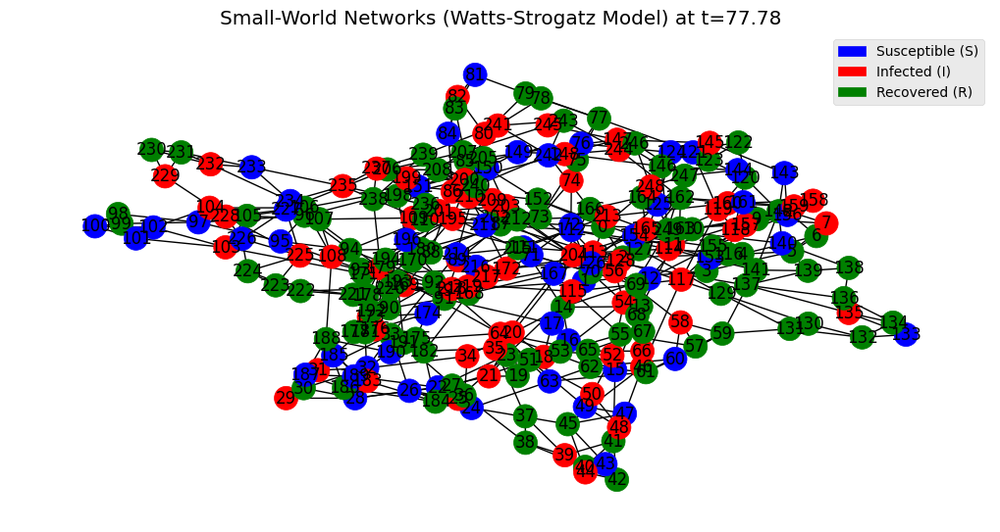

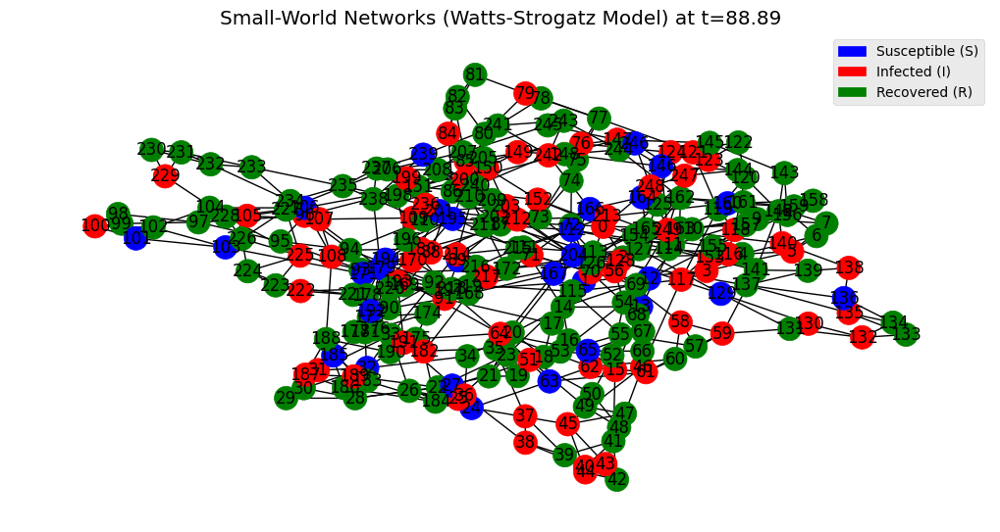

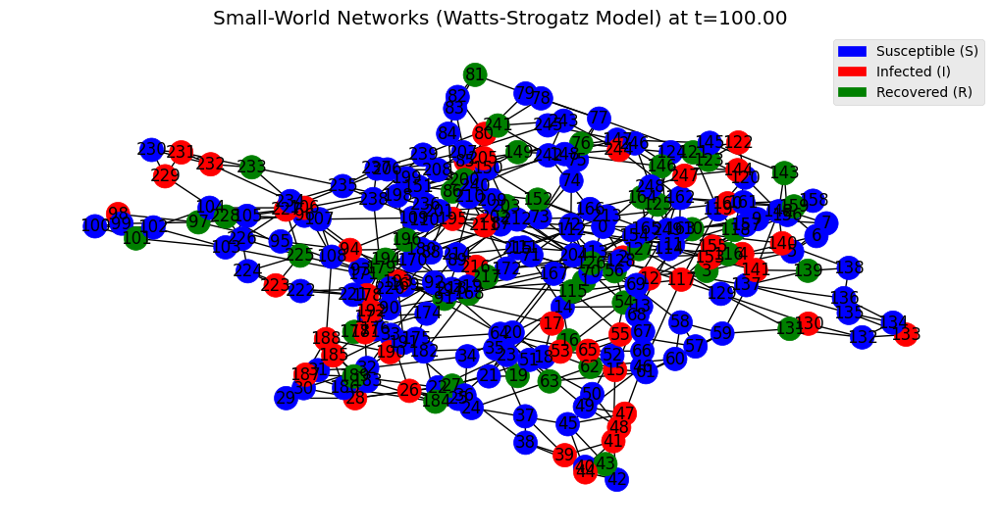

Effective Reproduction Number (Rt) at the beginning: 0.0031431275266398553


In [93]:
# Set seed
np.random.seed(42)

# Generate a Watts-Strogatz small-world network
n = 250
k = 5# Each node is connected to k nearest neighbors
p = 0.15  # Probability of rewiring each edge
G = nx.watts_strogatz_graph(n, k, p)

# Assign initial states to nodes based on S_in, I_in, R_in
initial_states = np.random.choice(['S', 'I', 'R'], size=len(G.nodes), p=[parameters['S_in'], parameters['I_in'], parameters['R_in']])
for node, state in zip(G.nodes, initial_states):
    G.nodes[node]['state'] = state

# Simulate SIRS dynamics on the graph
pos = nx.spring_layout(G)  # Fixed layout for all iterations

# Determine the indices of the time points to plot
plot_intervals = np.linspace(0, len(TS) - 1, 10).astype(int)

# Define colors for each state
node_colors = {'S': 'blue', 'I': 'red', 'R': 'green'}

# Create custom legend
legend_elements = [
    Patch(facecolor='blue', edgecolor='blue', label='Susceptible (S)'),
    Patch(facecolor='red', edgecolor='red', label='Infected (I)'),
    Patch(facecolor='green', edgecolor='green', label='Recovered (R)')
]

for t_index in plot_intervals:
    node_colors = {'S': 'blue', 'I': 'red', 'R': 'green'}
    node_color = [node_colors[G.nodes[node]['state']] for node in G.nodes]

    # Draw the graph with updated node colors
    nx.draw(G, pos, with_labels=True, node_color=node_color)
    plt.legend(handles=legend_elements, loc='best')
    plt.title(f'Small-World Networks (Watts-Strogatz Model) at t={TS[t_index]:.2f}')
    plt.show()

    

    # Update states of nodes based on SIRS simulation results up to the next plot interval
    for t in range(t_index, len(TS) if t_index == plot_intervals[-1] else plot_intervals[plot_intervals.tolist().index(t_index) + 1]):
        for node in G.nodes:
            if G.nodes[node]['state'] == 'S':
                if np.random.random() < Is[t]:  # Infection dynamics
                    G.nodes[node]['state'] = 'I'
            elif G.nodes[node]['state'] == 'I':
                if np.random.random() < Rs[t]:  # Recovery dynamics
                    G.nodes[node]['state'] = 'R'
            elif G.nodes[node]['state'] == 'R':
                if np.random.random() < Ss[t]:  # Loss of immunity dynamics
                    G.nodes[node]['state'] = 'S'


# Calculate effective reproduction number Rt over time
Rt = R0 * Ss / len(G.nodes)
print(f"Effective Reproduction Number (Rt) at the beginning: {Rt[0]}")

### Various metrics to analyze the graph's properties

Average degree: 4.0
Average clustering coefficient: 0.30746666666666667
Average shortest path length: 5.568706827309237
Diameter: 10
Node 0: Degree Centrality = 0.01606425702811245
Node 1: Degree Centrality = 0.024096385542168672
Node 2: Degree Centrality = 0.01606425702811245
Node 3: Degree Centrality = 0.012048192771084336
Node 4: Degree Centrality = 0.01606425702811245
Node 0: Betweenness Centrality = 0.023687142331477742
Node 1: Betweenness Centrality = 0.07517923791959111
Node 2: Betweenness Centrality = 0.0393990652838212
Node 3: Betweenness Centrality = 0.00962974395894882
Node 4: Betweenness Centrality = 0.012623355374006946
Degree Assortativity: -0.08138873079112258
Global Efficiency: 0.2090918467520744
Local Efficiency: 0.3842


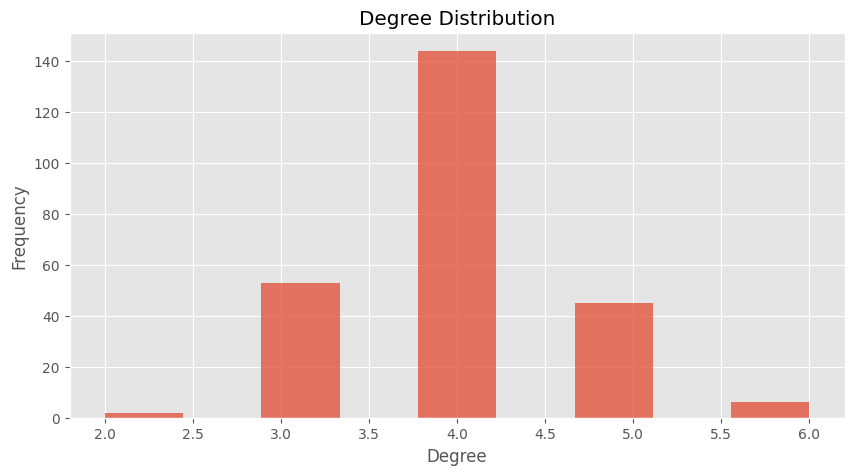

Number of communities detected: 16
Number of communities detected: 16
Modularity: 0.7406539999999999


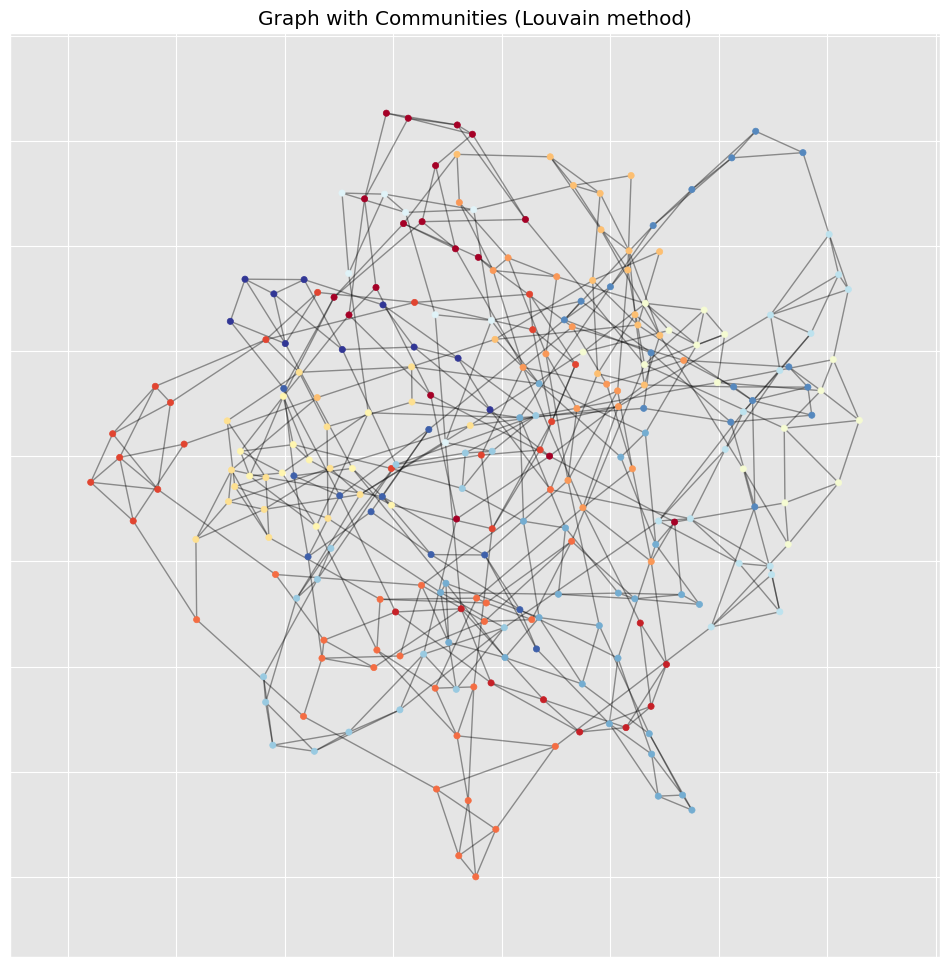

In [95]:
# Degree distribution
degree_sequence = [d for n, d in G.degree()]

# Average degree
avg_degree = sum(degree_sequence) / len(degree_sequence)

print(f"Average degree: {avg_degree}")

# Clustering coefficient
avg_clustering = nx.average_clustering(G)

print(f"Average clustering coefficient: {avg_clustering}")

# Average shortest path length
avg_shortest_path_length = nx.average_shortest_path_length(G)

print(f"Average shortest path length: {avg_shortest_path_length}")

# Diameter (may need to handle exceptions if graph is not connected)
try:
    diameter = nx.diameter(G)
    print(f"Diameter: {diameter}")
except nx.NetworkXError:
    print("Graph is not connected.")

# Degree centrality
degree_centrality = nx.degree_centrality(G)

# Example: Print degree centrality of the first few nodes
for node in list(G.nodes())[:5]:
    print(f"Node {node}: Degree Centrality = {degree_centrality[node]}")

# Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Example: Print betweenness centrality of the first few nodes
for node in list(G.nodes())[:5]:
    print(f"Node {node}: Betweenness Centrality = {betweenness_centrality[node]}")

# Assortativity
assortativity = nx.degree_assortativity_coefficient(G)
print(f"Degree Assortativity: {assortativity}")


# Global efficiency
global_efficiency = nx.global_efficiency(G)
print(f"Global Efficiency: {global_efficiency}")


# Local efficiency
local_efficiency = nx.local_efficiency(G)
print(f"Local Efficiency: {local_efficiency}")

# Degree histogram
degree_sequence = [d for n, d in G.degree()]
plt.hist(degree_sequence, bins='auto', alpha=0.75)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution')
plt.show()

# Community detection using Louvain method
import community

partition = community.best_partition(G)
print(f"Number of communities detected: {len(set(partition.values()))}")

# Community detection using Louvain method
partition = community.best_partition(G)
print(f"Number of communities detected: {len(set(partition.values()))}")

# Modularity
modularity = community.modularity(partition, G)
print(f"Modularity: {modularity}")

# Visualization of communities (optional)
pos = nx.spring_layout(G)
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G, pos, node_size=20, cmap=plt.cm.RdYlBu, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.4)
plt.title('Graph with Communities (Louvain method)')
plt.show()



## 2. Random graph (Erdős-Rényi)

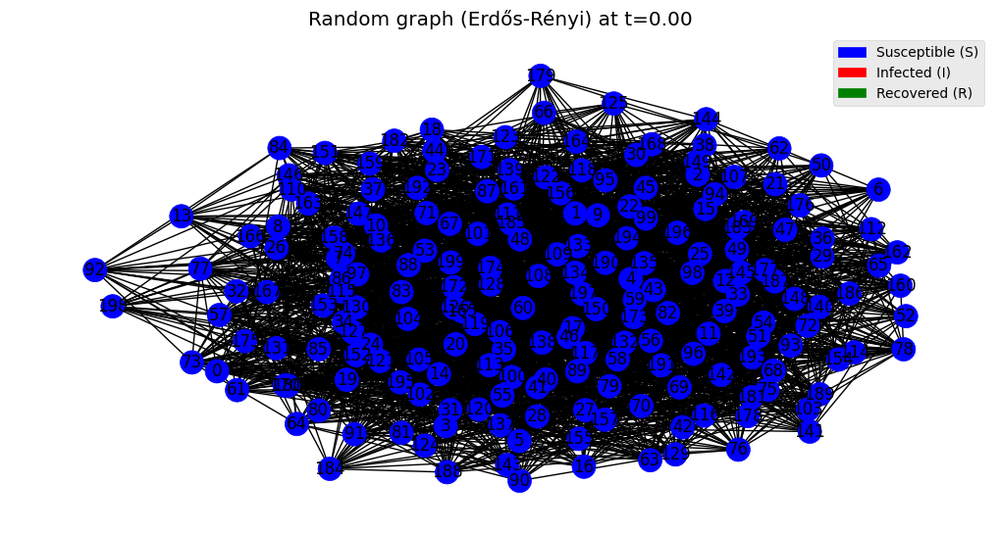

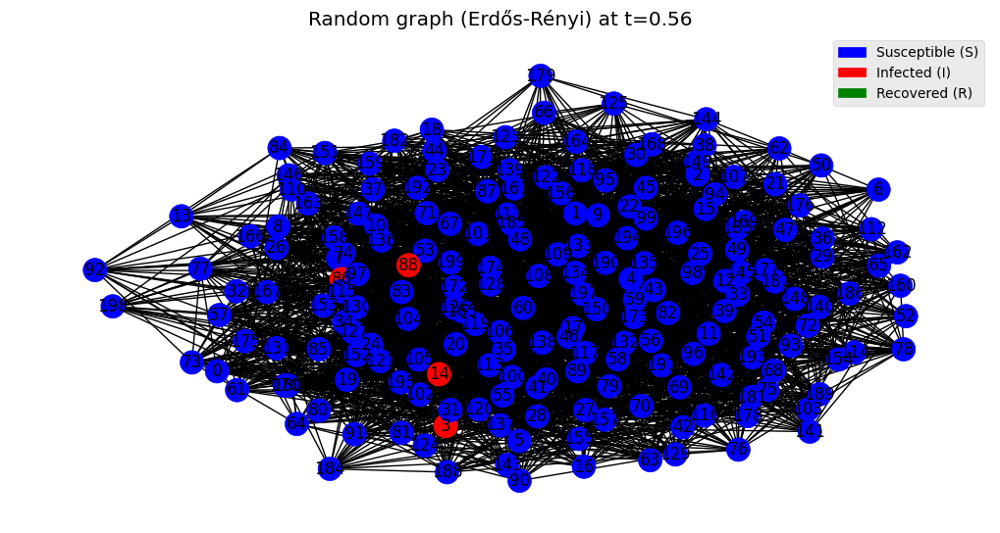

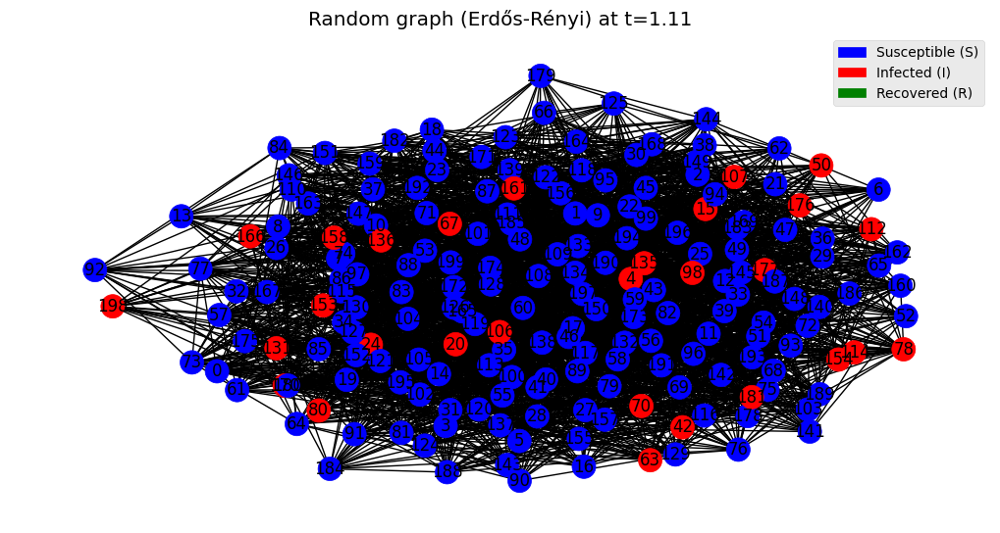

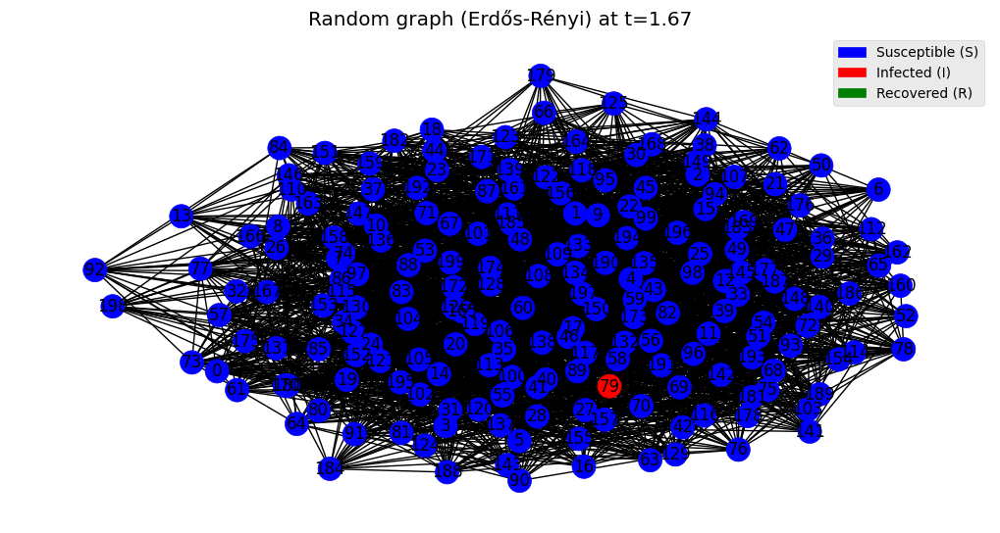

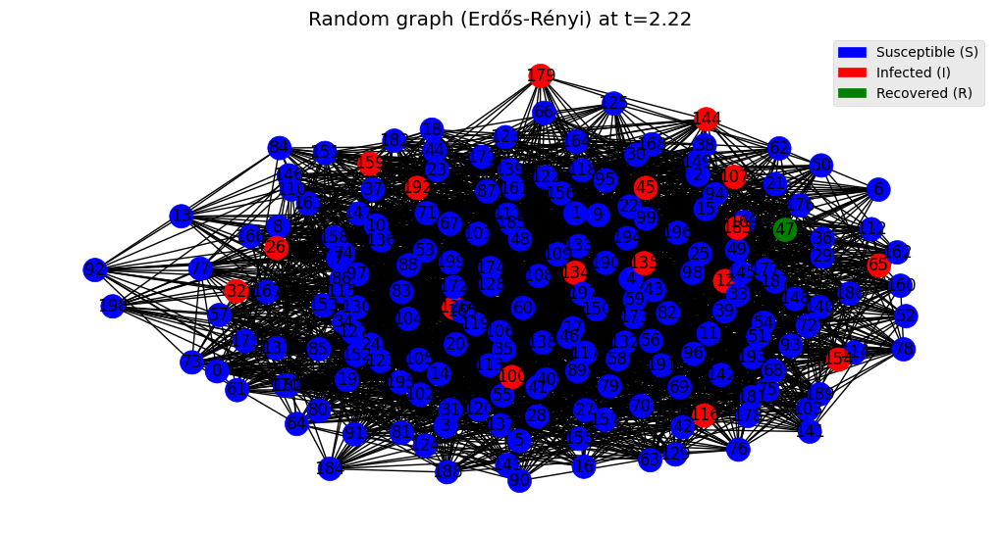

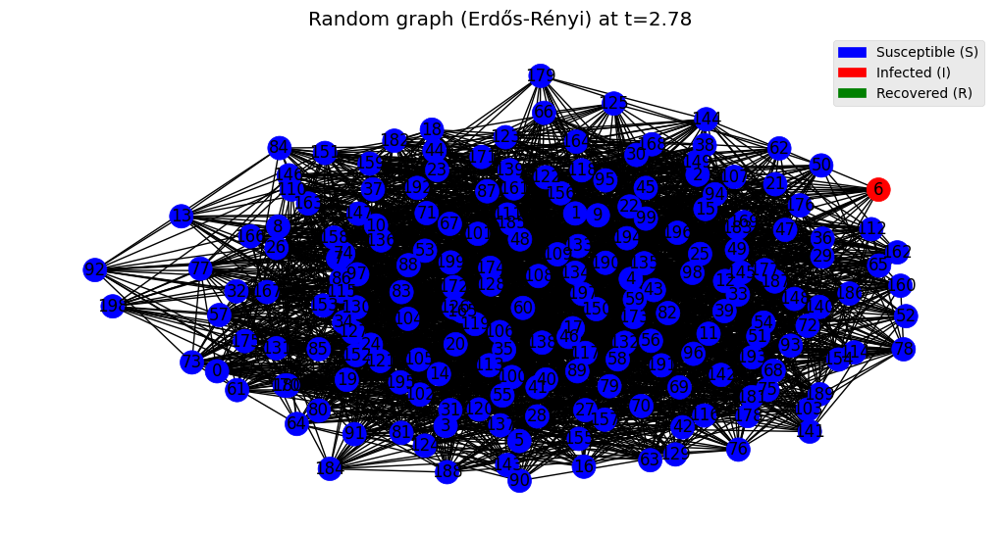

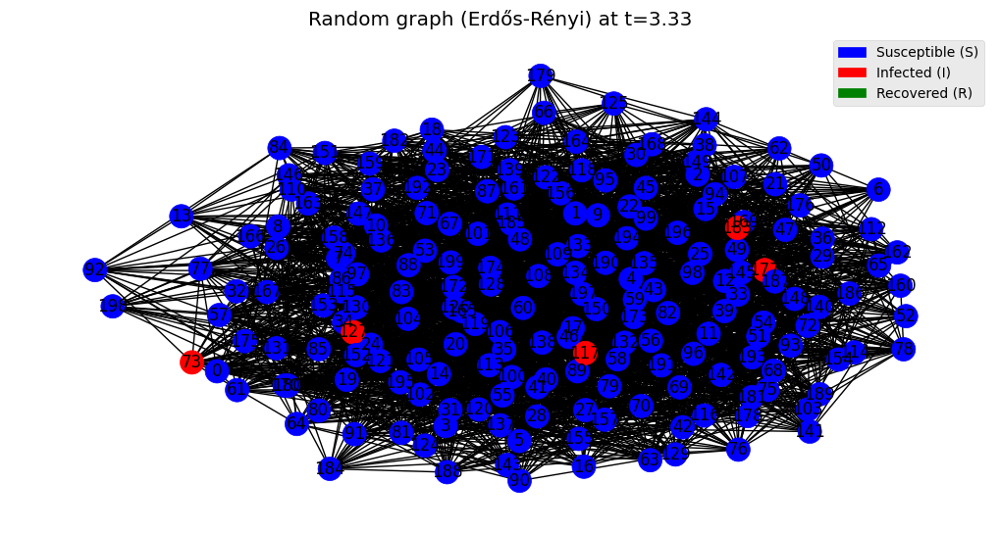

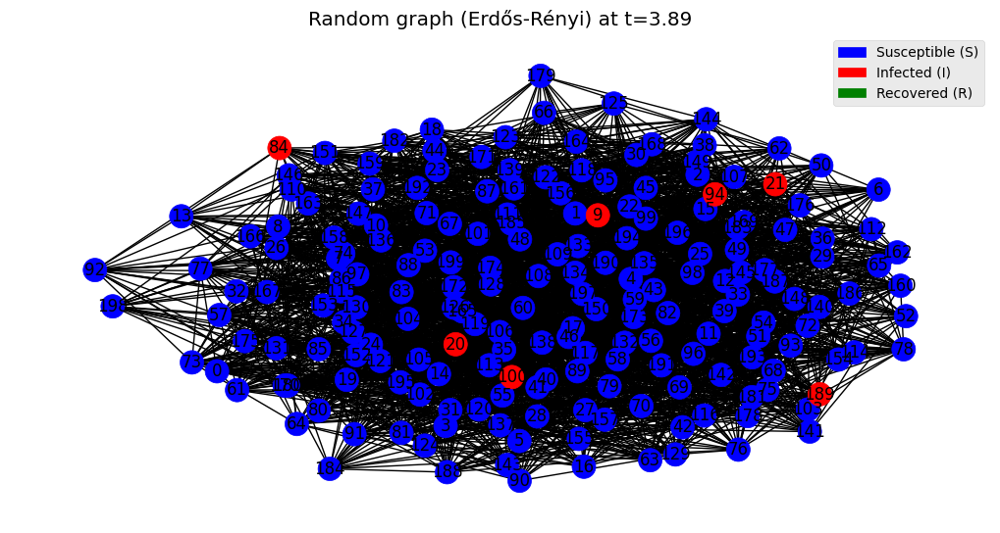

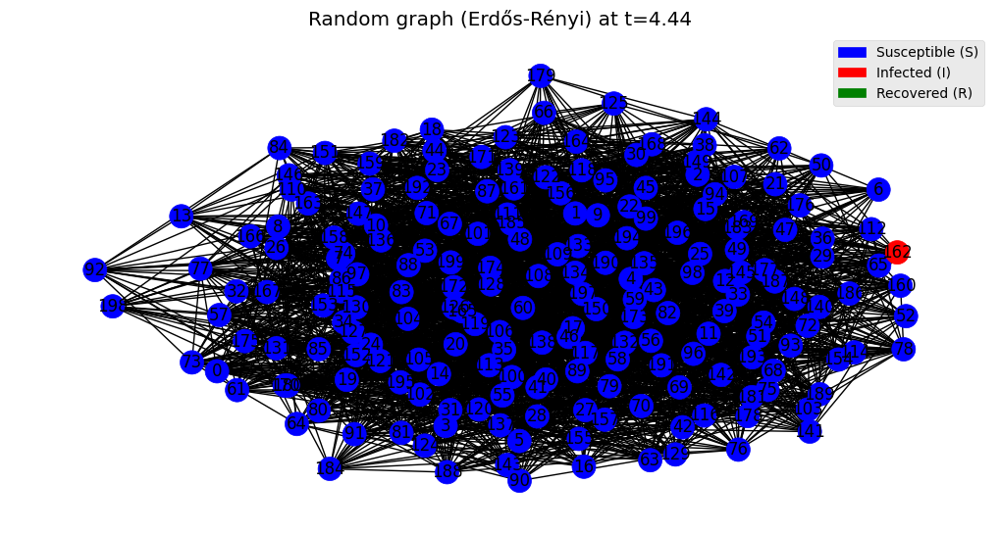

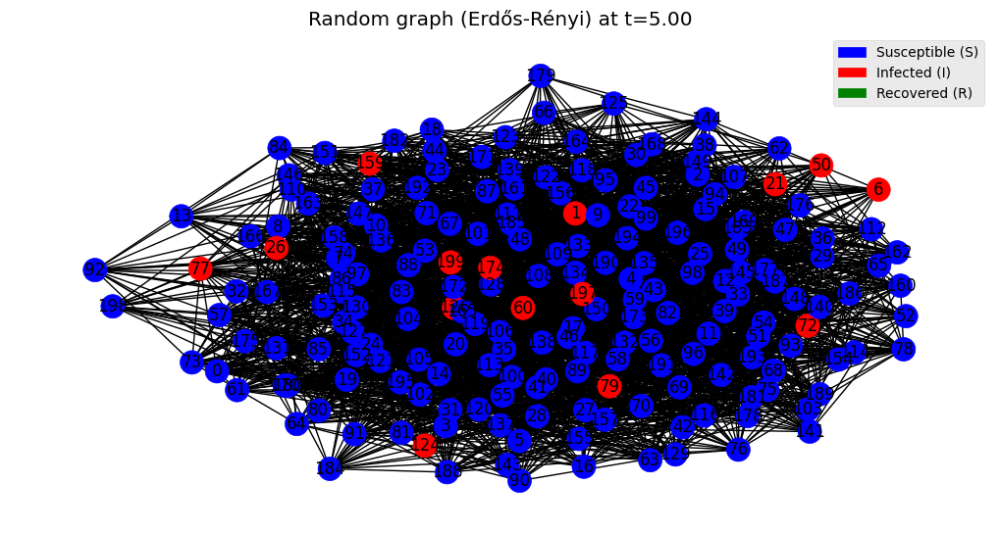

Effective Reproduction Number (Rt) at the beginning: 0.005045444444444444


In [98]:
np.random.seed(42)

# Create an Erdős-Rényi random graph
G = nx.erdos_renyi_graph(n=200, p=0.15)  # n: number of nodes, p: probability of edge creation

# Assign initial states to nodes based on S_in, I_in, R_in
initial_states = np.random.choice(['S', 'I', 'R'], size=len(G.nodes), p=[parameters['S_in'], parameters['I_in'], parameters['R_in']])
for node, state in zip(G.nodes, initial_states):
    G.nodes[node]['state'] = state

# Simulate SIRS dynamics on the graph
TS, Ss, Is, Rs = Euler_Maruyama_method(parameters)

pos = nx.spring_layout(G)  # Fixed layout for all iterations

# Determine the indices of the time points to plot
plot_intervals = np.linspace(0, len(TS) - 1, 10).astype(int)

# Define colors for each state
node_colors = {'S': 'blue', 'I': 'red', 'R': 'green'}

# Create custom legend
legend_elements = [
    Patch(facecolor='blue', edgecolor='blue', label='Susceptible (S)'),
    Patch(facecolor='red', edgecolor='red', label='Infected (I)'),
    Patch(facecolor='green', edgecolor='green', label='Recovered (R)')
]

for t_index in plot_intervals:
    node_colors = {'S': 'blue', 'I': 'red', 'R': 'green'}
    node_color = [node_colors[G.nodes[node]['state']] for node in G.nodes]

    # Draw the graph with updated node colors
    nx.draw(G, pos, with_labels=True, node_color=node_color)
    plt.legend(handles=legend_elements, loc='best')
    plt.title(f'Random graph (Erdős-Rényi) at t={TS[t_index]:.2f}')
    plt.show()

    

    # Update states of nodes based on SIRS simulation results up to the next plot interval
    for t in range(t_index, len(TS) if t_index == plot_intervals[-1] else plot_intervals[plot_intervals.tolist().index(t_index) + 1]):
        for node in G.nodes:
            if G.nodes[node]['state'] == 'S':
                if np.random.random() < Is[t]:  # Infection dynamics
                    G.nodes[node]['state'] = 'I'
            elif G.nodes[node]['state'] == 'I':
                if np.random.random() < Rs[t]:  # Recovery dynamics
                    G.nodes[node]['state'] = 'R'
            elif G.nodes[node]['state'] == 'R':
                if np.random.random() < Ss[t]:  # Loss of immunity dynamics
                    G.nodes[node]['state'] = 'S'

# Calculate effective reproduction number Rt over time
Rt = R0 * Ss / len(G.nodes)
print(f"Effective Reproduction Number (Rt) at the beginning: {Rt[0]}")

## 3. Scale-Free Networks (Barabási-Albert Model)

Scale-free networks are characterized by a small number of highly connected nodes (hubs) and many nodes with only a few connections. The Barabási-Albert model is a popular method to generate scale-free networks.

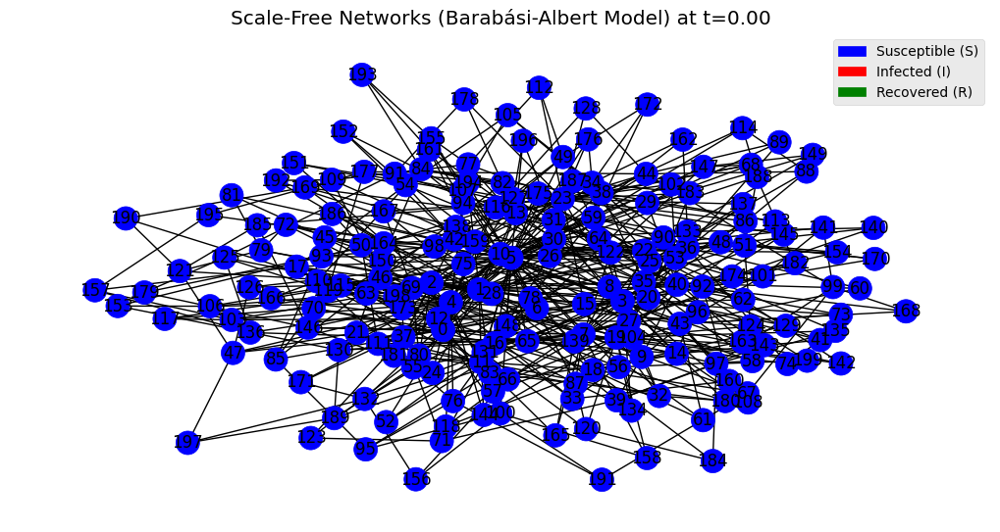

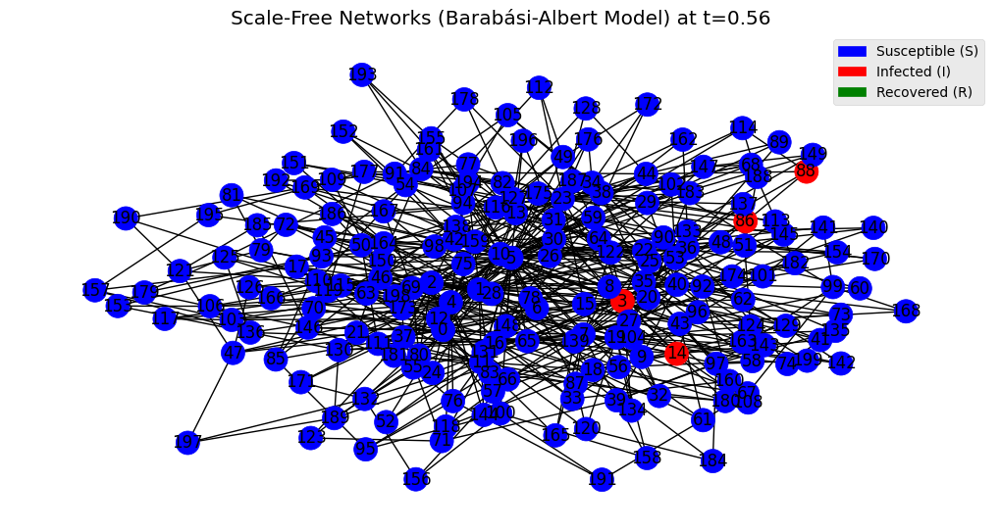

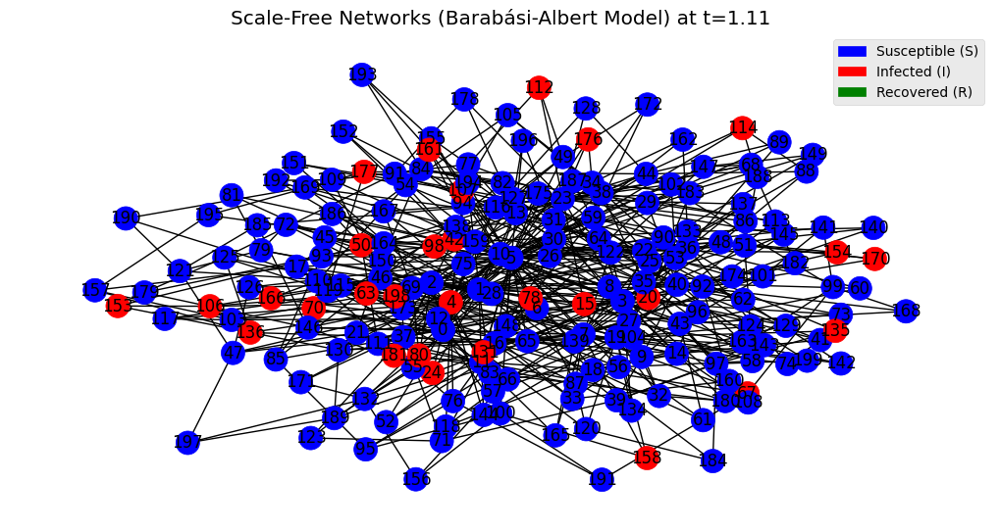

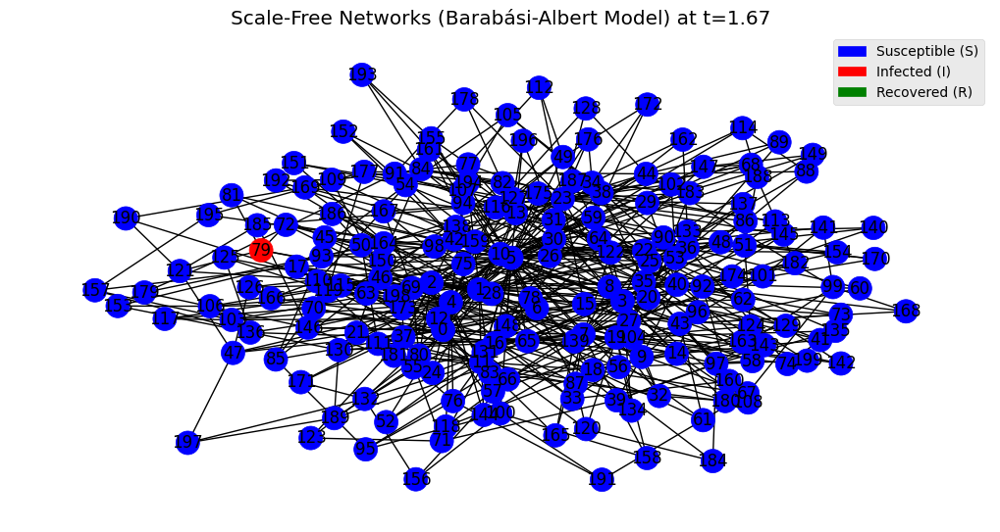

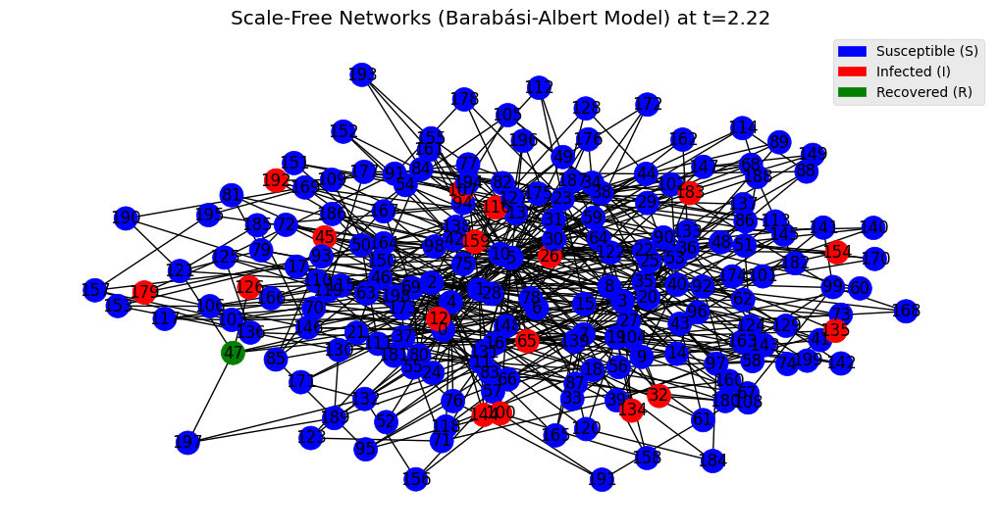

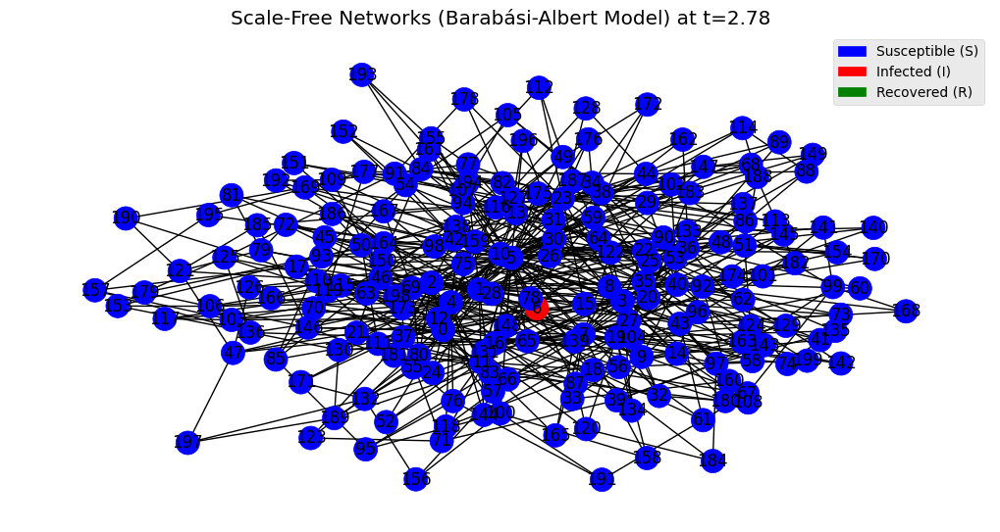

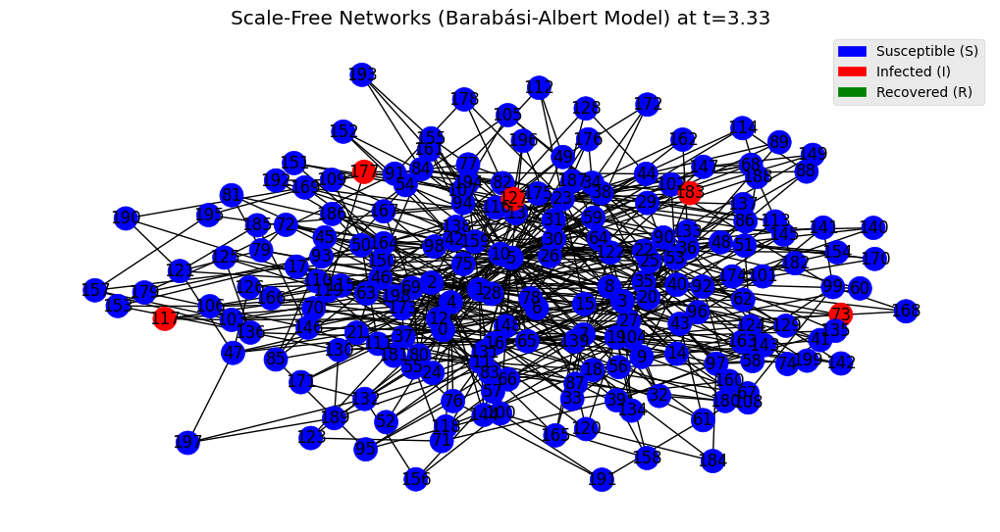

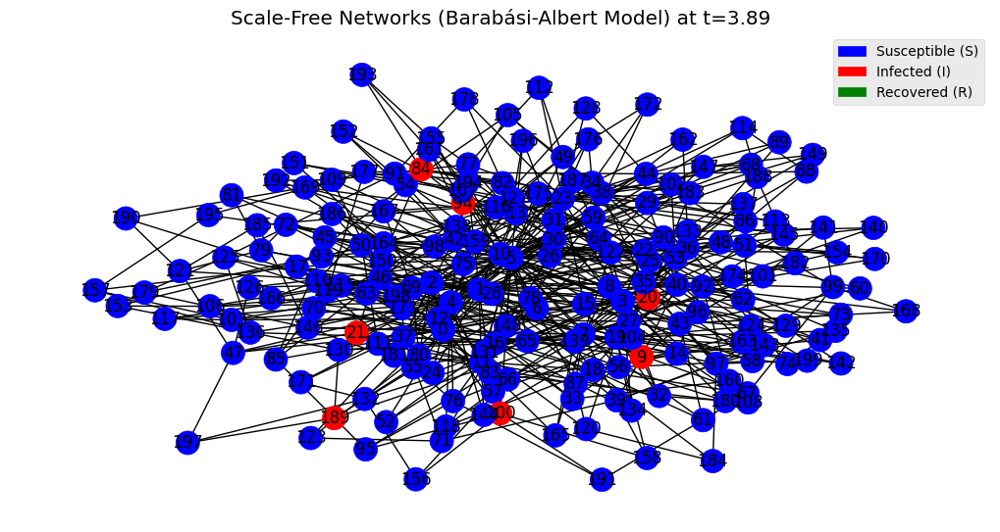

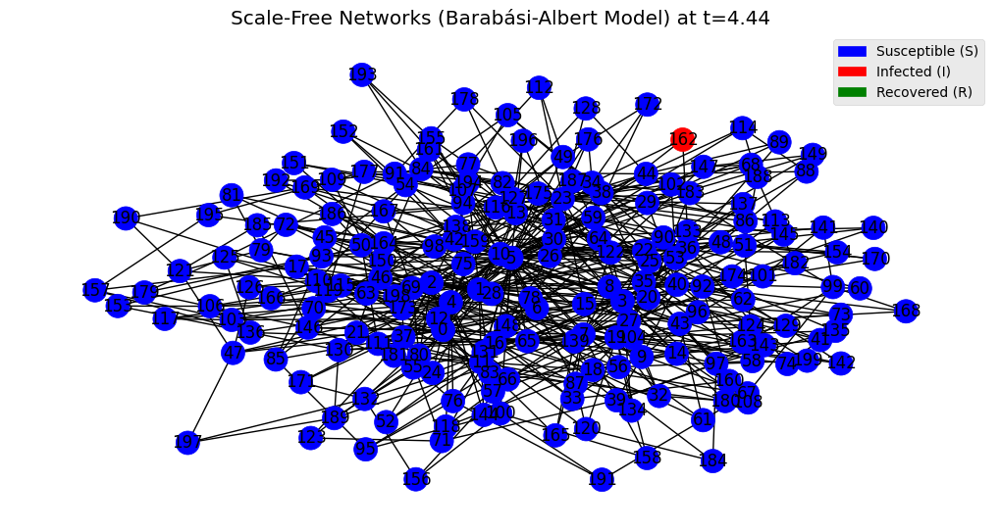

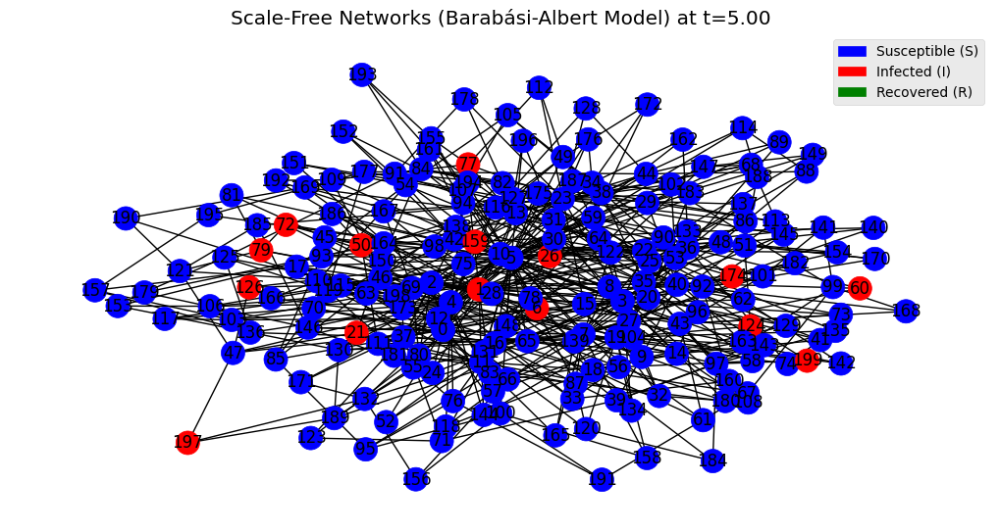

Effective Reproduction Number (Rt) at the beginning: 0.005045444444444444


In [99]:
np.random.seed(42)

# Generate a Barabási-Albert scale-free network
n = 200
m = 3  # Number of edges to attach from a new node to existing nodes
G = nx.barabasi_albert_graph(n, m)

# Assign initial states to nodes based on S_in, I_in, R_in
initial_states = np.random.choice(['S', 'I', 'R'], size=len(G.nodes), p=[parameters['S_in'], parameters['I_in'], parameters['R_in']])
for node, state in zip(G.nodes, initial_states):
    G.nodes[node]['state'] = state

# Simulate SIRS dynamics on the graph
TS, Ss, Is, Rs = Euler_Maruyama_method(parameters)

# Simulate SIRS dynamics on the graph
pos = nx.spring_layout(G)  # Fixed layout for all iterations

# Determine the indices of the time points to plot
plot_intervals = np.linspace(0, len(TS) - 1, 10).astype(int)

# Define colors for each state
node_colors = {'S': 'blue', 'I': 'red', 'R': 'green'}

# Create custom legend
legend_elements = [
    Patch(facecolor='blue', edgecolor='blue', label='Susceptible (S)'),
    Patch(facecolor='red', edgecolor='red', label='Infected (I)'),
    Patch(facecolor='green', edgecolor='green', label='Recovered (R)')
]

for t_index in plot_intervals:
    node_colors = {'S': 'blue', 'I': 'red', 'R': 'green'}
    node_color = [node_colors[G.nodes[node]['state']] for node in G.nodes]

    # Draw the graph with updated node colors
    nx.draw(G, pos, with_labels=True, node_color=node_color)
    plt.legend(handles=legend_elements, loc='best')
    plt.title(f'Scale-Free Networks (Barabási-Albert Model) at t={TS[t_index]:.2f}')
    plt.show()

    

    # Update states of nodes based on SIRS simulation results up to the next plot interval
    for t in range(t_index, len(TS) if t_index == plot_intervals[-1] else plot_intervals[plot_intervals.tolist().index(t_index) + 1]):
        for node in G.nodes:
            if G.nodes[node]['state'] == 'S':
                if np.random.random() < Is[t]:  # Infection dynamics
                    G.nodes[node]['state'] = 'I'
            elif G.nodes[node]['state'] == 'I':
                if np.random.random() < Rs[t]:  # Recovery dynamics
                    G.nodes[node]['state'] = 'R'
            elif G.nodes[node]['state'] == 'R':
                if np.random.random() < Ss[t]:  # Loss of immunity dynamics
                    G.nodes[node]['state'] = 'S'


# Calculate effective reproduction number Rt over time
Rt = R0 * Ss / len(G.nodes)
print(f"Effective Reproduction Number (Rt) at the beginning: {Rt[0]}")